# Quality Assessment Method Comparison

Compare image quality assessment methods on PhotoTriage dataset:
- **Performance metrics**: Top-1/2 Accuracy, MRR, Runtime
- **Correlation analysis**: Which methods agree on series difficulty?
- **Method wins**: Cases where one method succeeds but others fail
- **Failure analysis**: Patterns in failure cases

## Configuration Options

**Option 1 - Single folder**: Specify exact benchmark directory
```python
AUTO_SCAN = False
BENCHMARK_DIR = "outputs/quality_benchmarks/benchmark_2025-11-14_00-06-59"
```

**Option 2 - Auto-scan** (recommended): Automatically find latest benchmark
```python
AUTO_SCAN = True
BENCHMARK_BASE_DIR = "outputs/quality_benchmarks"
```



In [1]:
# === Imports ===
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import sys

# Add project root to path
sys.path.insert(0, str(Path.cwd().parent))

from sim_bench.quality_assessment.analysis import (
    load_quality_results,
    merge_per_series_metrics,
    compute_correlation_matrix,
    plot_performance_comparison,
    plot_runtime_comparison,
    plot_efficiency_comparison,
    plot_correlation_heatmap,
    find_method_wins,
    visualize_method_wins,
    get_top_methods_by_accuracy,
    analyze_failures,
    plot_failure_analysis
)
from sim_bench.analysis.export import export_notebook_to_pdf, archive_notebook
from sim_bench.analysis.utils import get_project_root

sns.set_style('whitegrid')
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 100

print("✓ Imports successful")



✓ Imports successful


## Configuration



In [2]:
# === Configuration ===
PROJECT_ROOT = get_project_root()

# Choose scanning mode
AUTO_SCAN = True  # Set to False to use specific folder

if AUTO_SCAN:
    # Option 1: Auto-scan from base directory (uses latest)
    BENCHMARK_BASE_DIR = PROJECT_ROOT / "outputs" / "quality_benchmarks"
    BENCHMARK_DIR = None
    USE_LATEST = True
else:
    # Option 2: Specify exact benchmark directory
    BENCHMARK_BASE_DIR = None
    BENCHMARK_DIR = PROJECT_ROOT / "outputs" / "quality_benchmarks" / "benchmark_2025-11-14_00-06-59"
    USE_LATEST = False

# Analysis parameters
TOP_N_METHODS = 4  # Number of top methods to show in wins visualization
TOP_N_IMAGES = 3   # Number of top images to show per method

# Export options
EXPORT_HTML = True  # Export notebook to HTML at the end

print(f"Scanning mode: {'AUTO' if AUTO_SCAN else 'MANUAL'}")
if AUTO_SCAN:
    print(f"Base directory: {BENCHMARK_BASE_DIR.relative_to(PROJECT_ROOT)}")
else:
    print(f"Benchmark directory: {BENCHMARK_DIR.relative_to(PROJECT_ROOT)}")



Scanning mode: AUTO
Base directory: outputs\quality_benchmarks


## 1. Load Data



In [3]:
# Load benchmark results
methods_summary_df, detailed_results_df, series_data_dict, benchmark_dir = load_quality_results(
    benchmark_dir=BENCHMARK_DIR,
    auto_scan=AUTO_SCAN,
    base_dir=BENCHMARK_BASE_DIR,
    use_latest=USE_LATEST
)

print(f"\n{'='*80}")
print("DATA SUMMARY")
print(f"{'='*80}")
print(f"Benchmark directory: {benchmark_dir.name}")
print(f"Methods found: {len(methods_summary_df)}")
print(f"Methods: {', '.join(methods_summary_df['method'].tolist())}")
print(f"\nMethods Summary:")
display(methods_summary_df)

print(f"\nDetailed Results:")
display(detailed_results_df)



Using latest benchmark: benchmark_2025-11-14_00-06-59
Loaded colorfulness_only: 4985 series
Loaded composite_balanced: 4985 series
Loaded composite_exposure_focused: 4985 series
Loaded composite_sharpness_focused: 4985 series
Loaded contrast_only: 4985 series
Loaded exposure_only: 4985 series
Loaded sharpness_only: 4985 series

DATA SUMMARY
Benchmark directory: benchmark_2025-11-14_00-06-59
Methods found: 7
Methods: sharpness_only, contrast_only, exposure_only, composite_balanced, composite_sharpness_focused, composite_exposure_focused, colorfulness_only

Methods Summary:


,method,avg_top1_accuracy,avg_top2_accuracy,avg_mrr,avg_time_ms,datasets_tested
0,sharpness_only,0.649549,0.774724,0.580794,55.274982,1
1,contrast_only,0.483651,0.831695,0.659964,46.747997,1
2,exposure_only,0.429890,0.851153,0.685177,46.969639,1
3,composite_balanced,0.421264,0.846540,0.679845,45.165716,1
4,composite_sharpness_focused,0.419458,0.848345,0.679364,47.465297,1
5,composite_exposure_focused,0.418656,0.851354,0.679531,46.749548,1
6,colorfulness_only,0.415647,0.849549,0.674912,46.797967,1



Detailed Results:


,dataset,method,top1_accuracy,top2_accuracy,mrr,avg_time_ms,throughput
0,phototriage,sharpness_only,0.649549,0.774724,0.580794,55.274982,18.091367
1,phototriage,exposure_only,0.429890,0.851153,0.685177,46.969639,21.290349
2,phototriage,colorfulness_only,0.415647,0.849549,0.674912,46.797967,21.368449
3,phototriage,contrast_only,0.483651,0.831695,0.659964,46.747997,21.391291
4,phototriage,composite_balanced,0.421264,0.846540,0.679845,45.165716,22.140688
5,phototriage,composite_sharpness_focused,0.419458,0.848345,0.679364,47.465297,21.068023
6,phototriage,composite_exposure_focused,0.418656,0.851354,0.679531,46.749548,21.390581


## 2. Performance Metrics Comparison



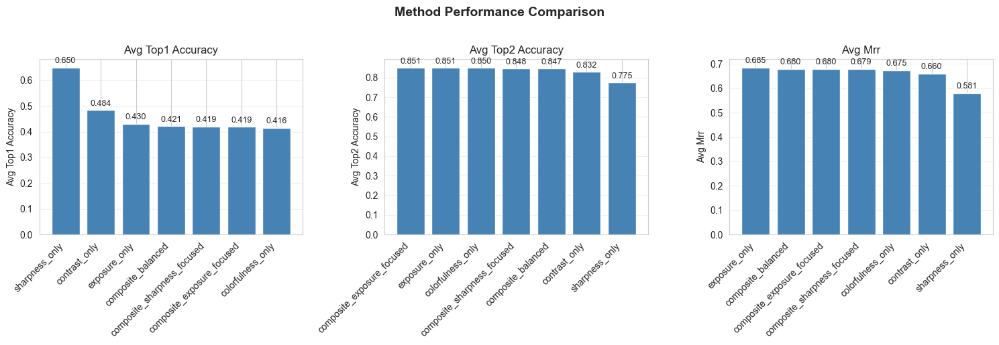

In [4]:
# Plot performance comparison
fig = plot_performance_comparison(methods_summary_df)
plt.show()



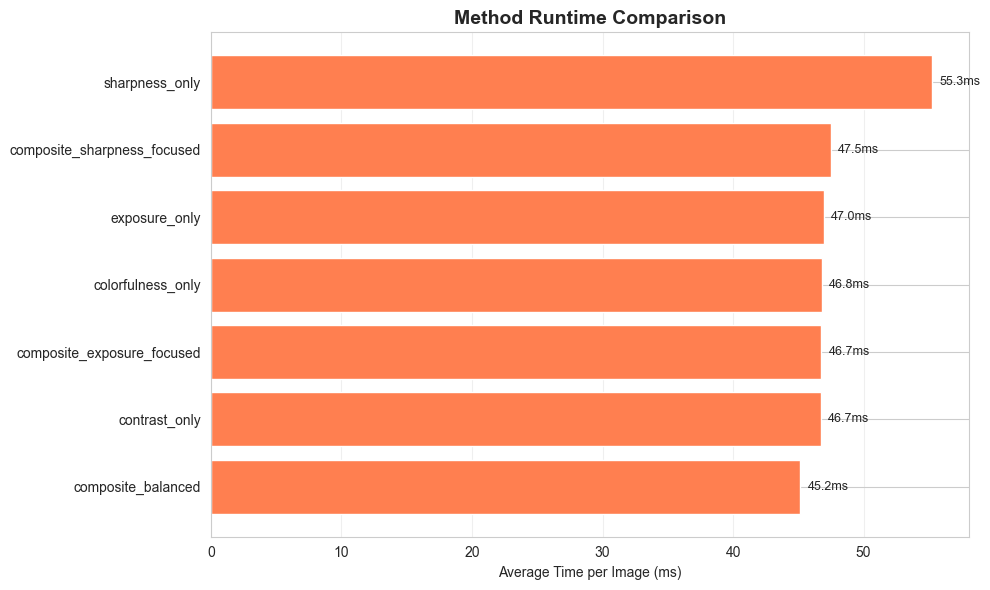

In [5]:
# Plot runtime comparison
fig = plot_runtime_comparison(detailed_results_df)
plt.show()



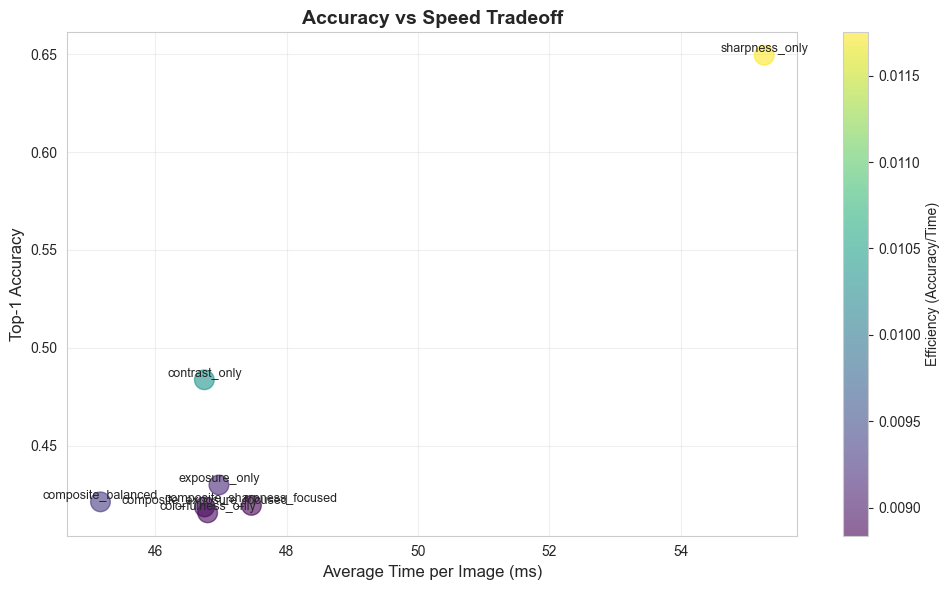

In [6]:
# Plot efficiency (accuracy vs speed)
fig = plot_efficiency_comparison(methods_summary_df)
plt.show()



## 3. Correlation Matrix

Analyze which methods agree on series difficulty (Top-1 Accuracy correlation).



Merged 4985 series across 7 methods

Correlation Matrix:


,sharpness_only,contrast_only,exposure_only,composite_balanced,composite_sharpness_focused,composite_exposure_focused,colorfulness_only
sharpness_only,1.000000,0.066415,0.112971,0.533011,0.578351,0.446916,0.079456
contrast_only,0.066415,1.000000,0.077465,0.207581,0.295844,0.338994,-0.079109
exposure_only,0.112971,0.077465,1.000000,0.252131,0.212757,0.302112,0.190971
composite_balanced,0.533011,0.207581,0.252131,1.000000,0.843992,0.806900,0.340578
composite_sharpness_focused,0.578351,0.295844,0.212757,0.843992,1.000000,0.834377,0.206940
composite_exposure_focused,0.446916,0.338994,0.302112,0.806900,0.834377,1.000000,0.245495
colorfulness_only,0.079456,-0.079109,0.190971,0.340578,0.206940,0.245495,1.000000


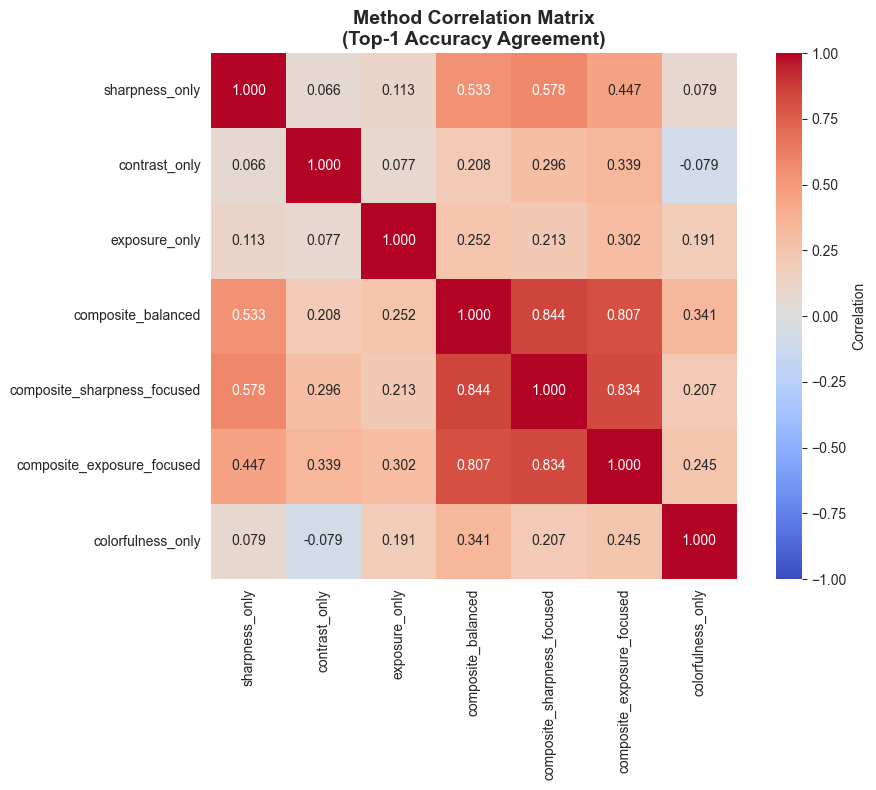

In [7]:
# Merge per-series data for correlation analysis
methods = methods_summary_df['method'].tolist()
merged_df = merge_per_series_metrics(series_data_dict, methods=methods, metric='correct')

print(f"Merged {len(merged_df)} series across {len(methods)} methods")

# Compute correlation matrix
corr_matrix = compute_correlation_matrix(merged_df, methods=methods, metric='correct')

print(f"\nCorrelation Matrix:")
display(corr_matrix)

# Plot correlation heatmap
fig = plot_correlation_heatmap(corr_matrix, methods=methods)
plt.show()



## 4. Method Wins Visualization

Show cases where one method succeeds but others fail. Displays:
- Ground truth best image
- Top 3 scoring images for each method (with scores and filenames)



In [8]:
# Get top N methods by accuracy
top_methods = get_top_methods_by_accuracy(methods_summary_df, top_n=TOP_N_METHODS)
print(f"Top {TOP_N_METHODS} methods: {', '.join(top_methods)}")

# Find method wins (cases where one method succeeds but others fail)
wins_dict = find_method_wins(merged_df, methods=top_methods, top_n_series=3)

print(f"\nMethod Wins Found:")
for method, wins_df in wins_dict.items():
    print(f"  {method}: {len(wins_df)} winning series")



Top 4 methods: sharpness_only, contrast_only, exposure_only, composite_balanced

Method Wins Found:
  sharpness_only: 3 winning series
  contrast_only: 3 winning series
  exposure_only: 3 winning series
  composite_balanced: 3 winning series


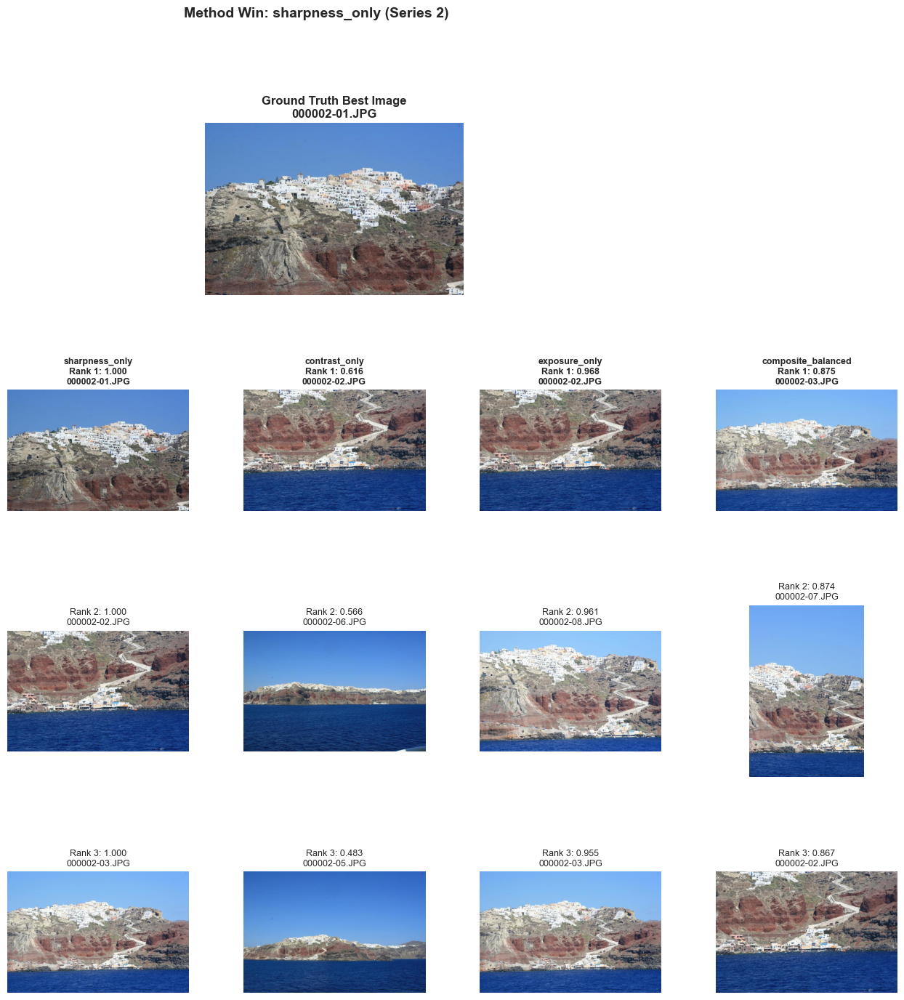

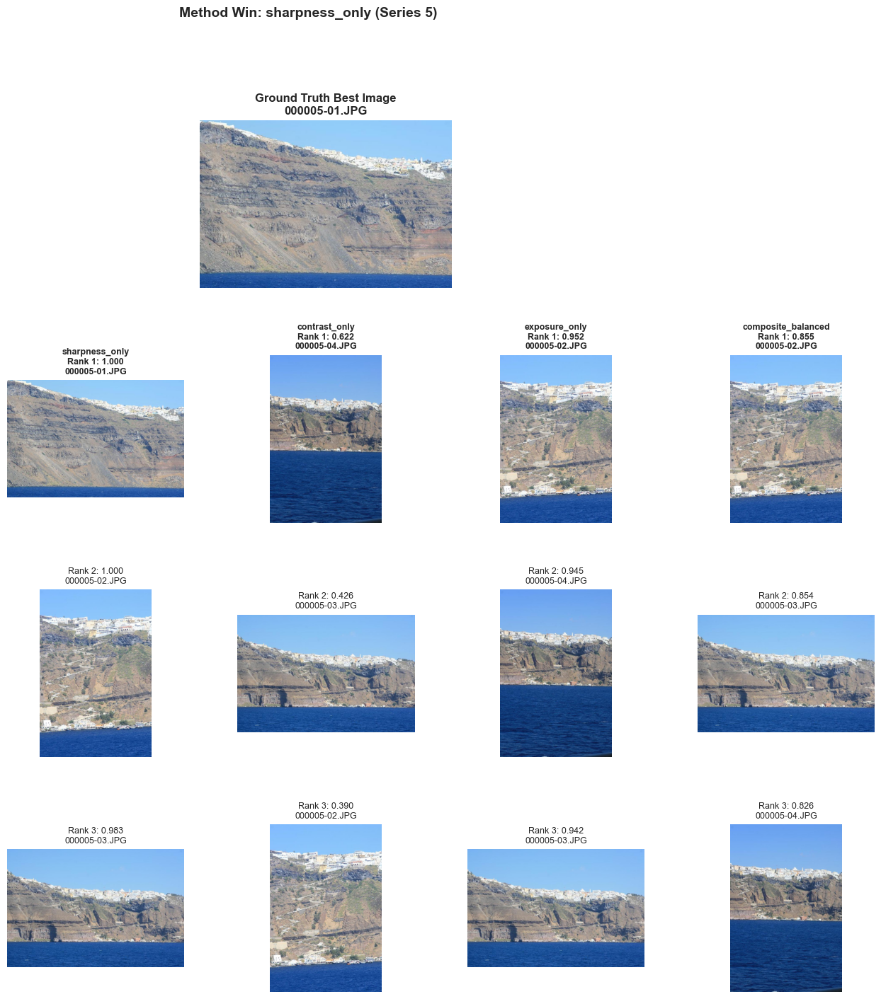

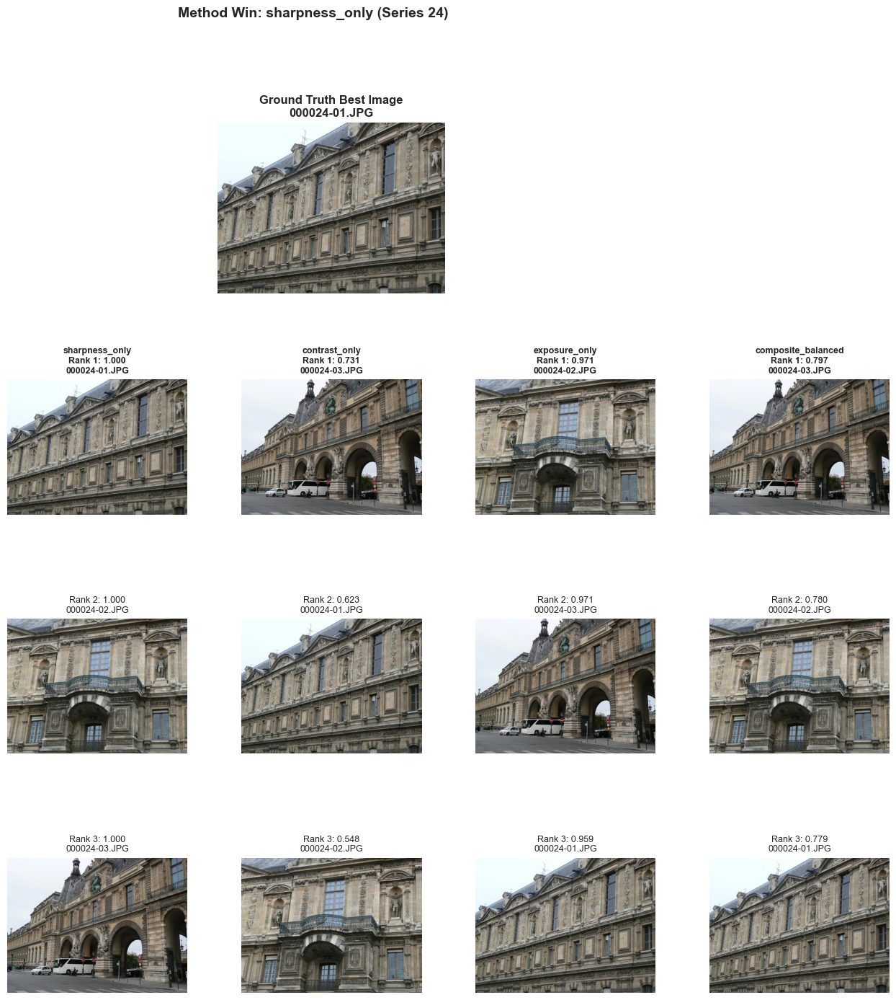

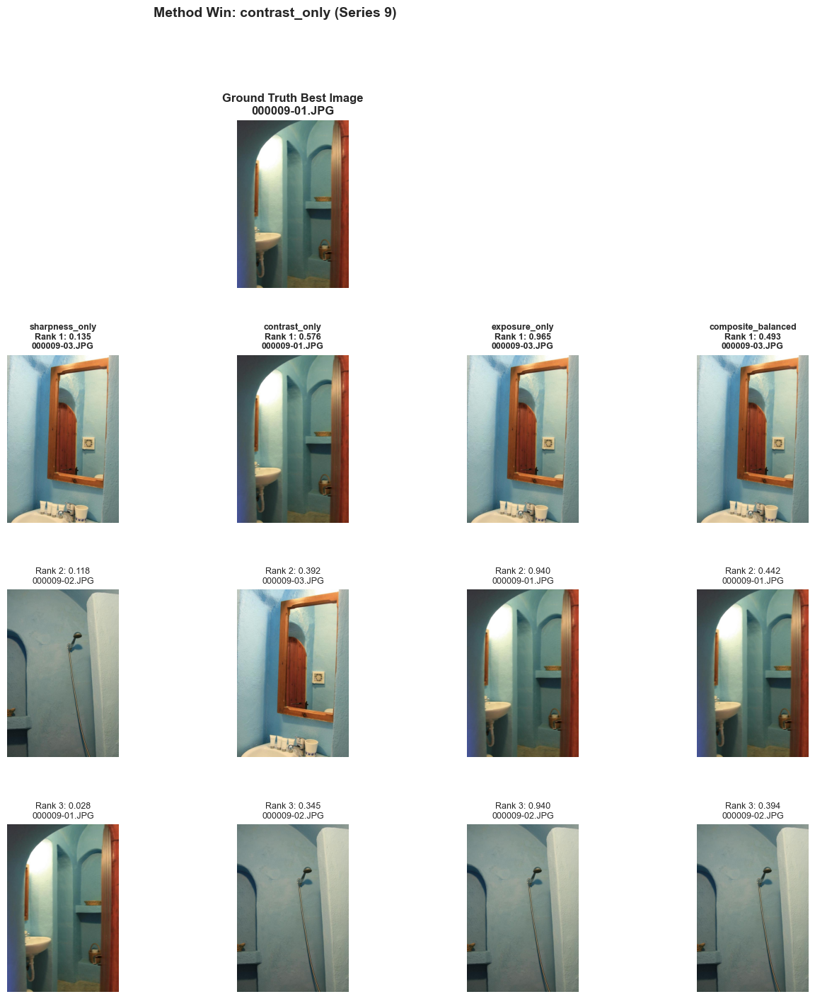

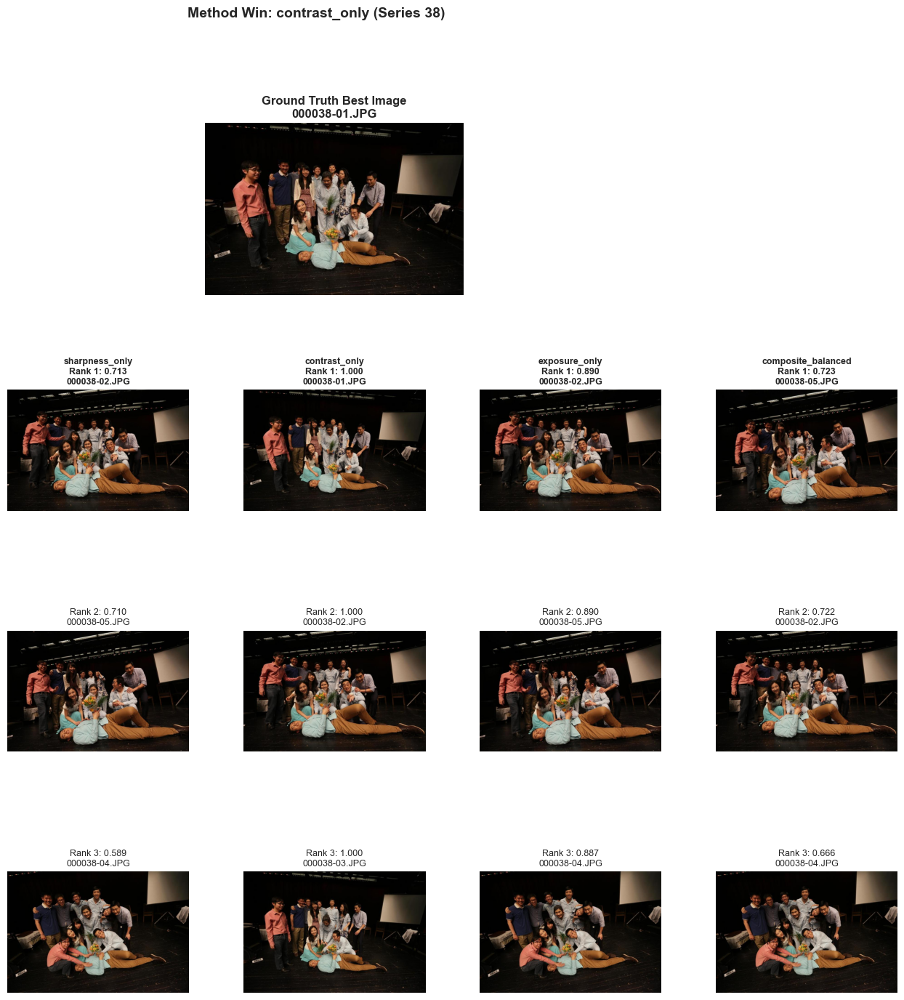

...

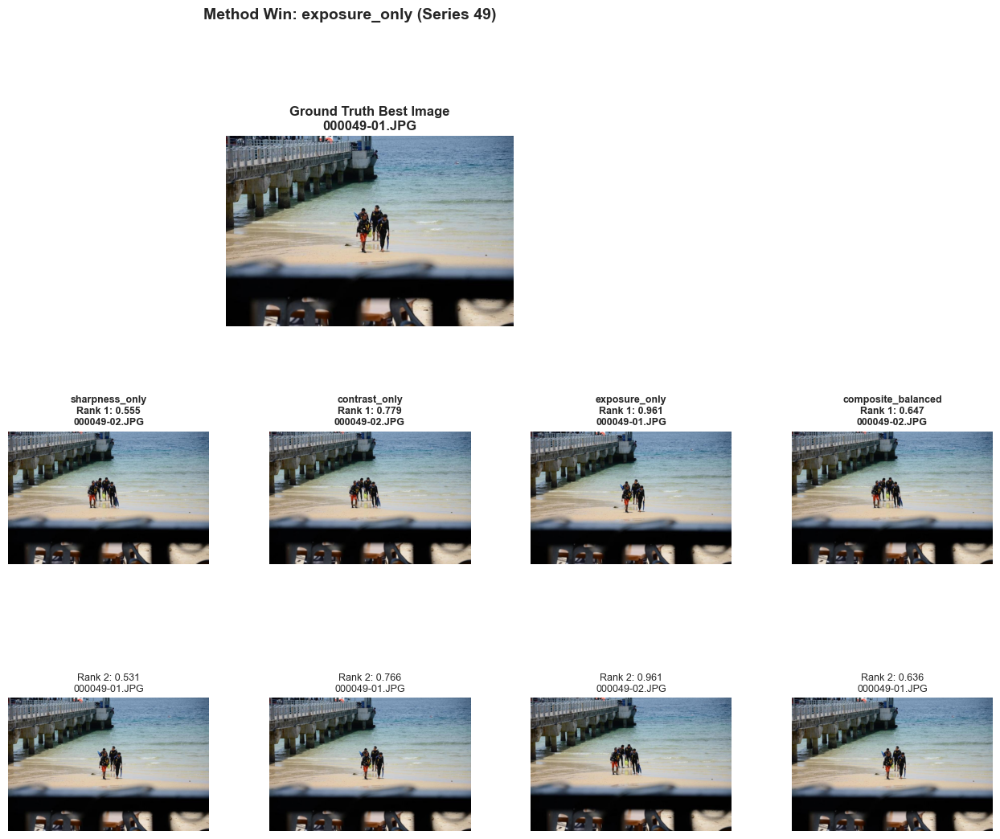

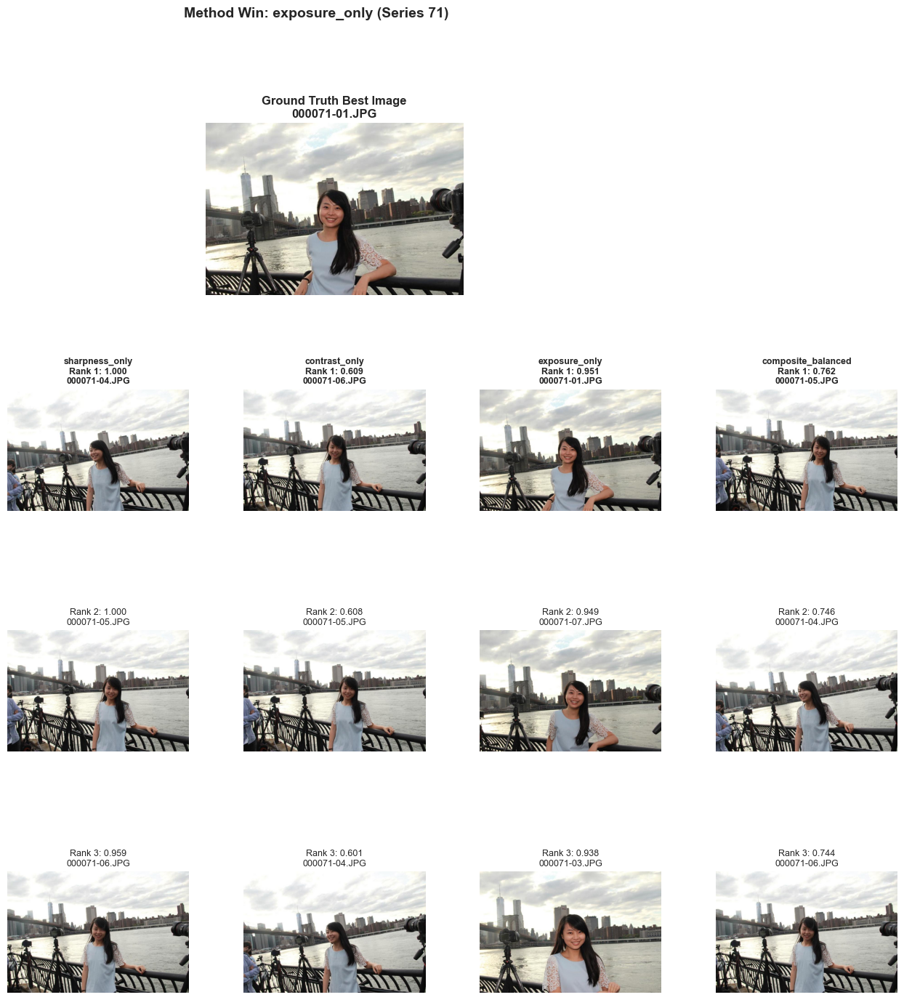

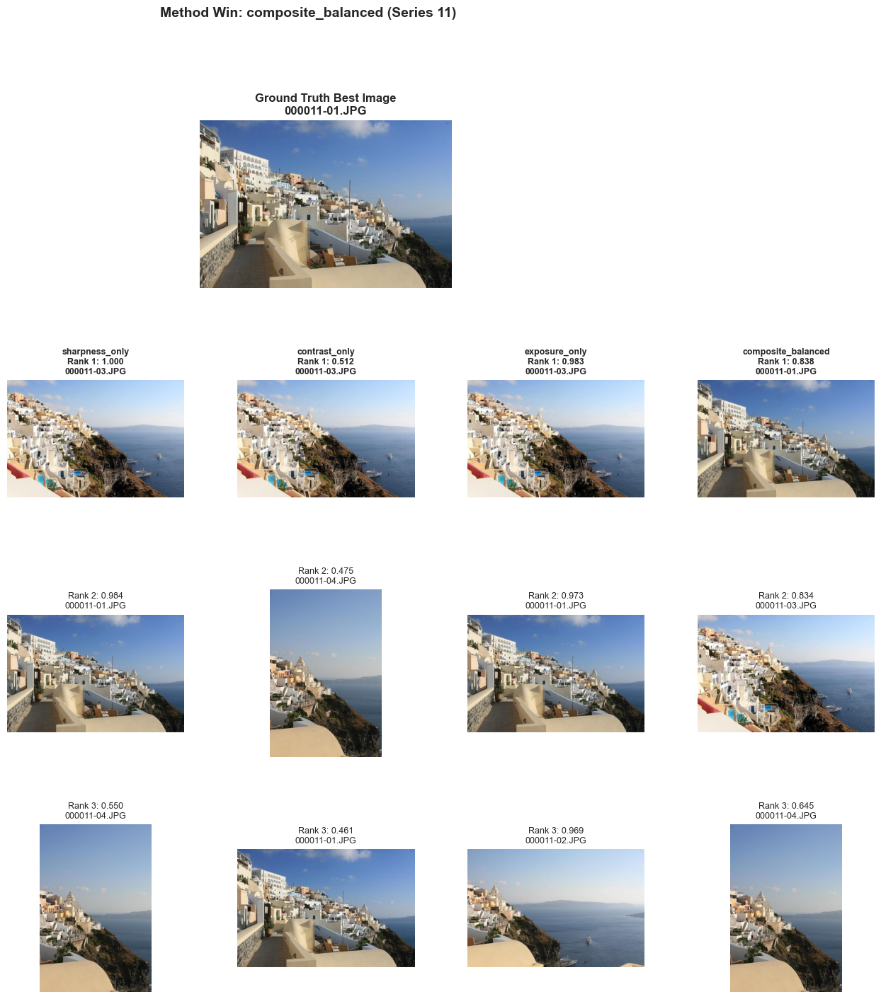

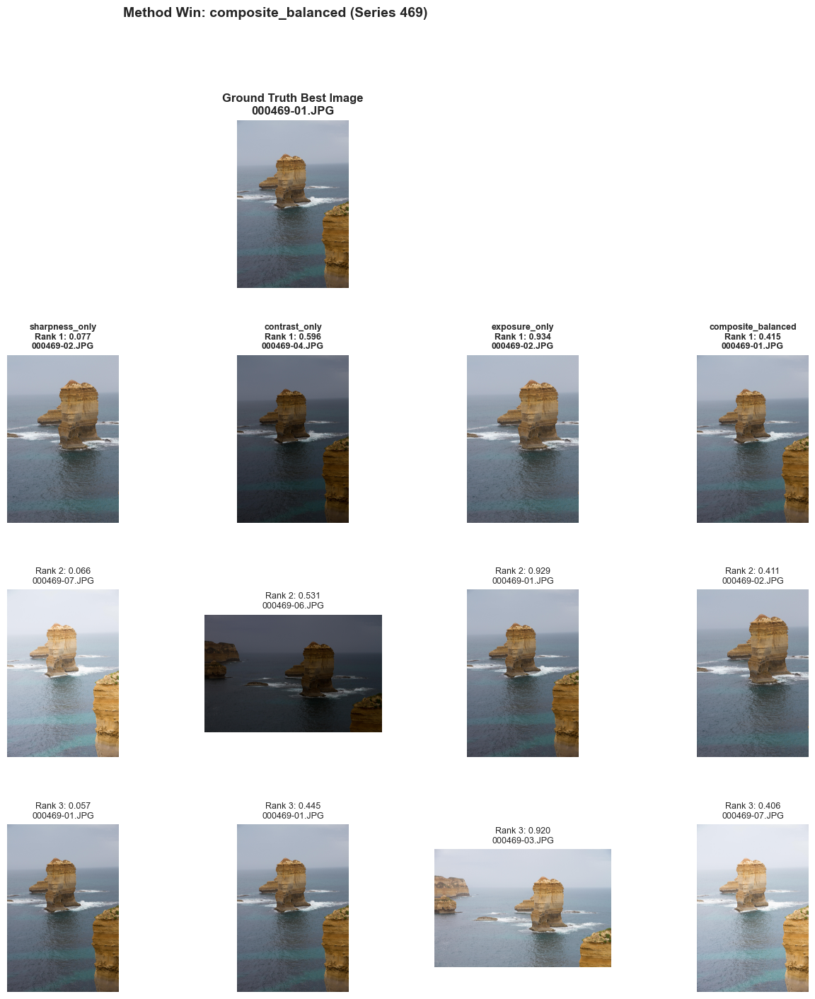

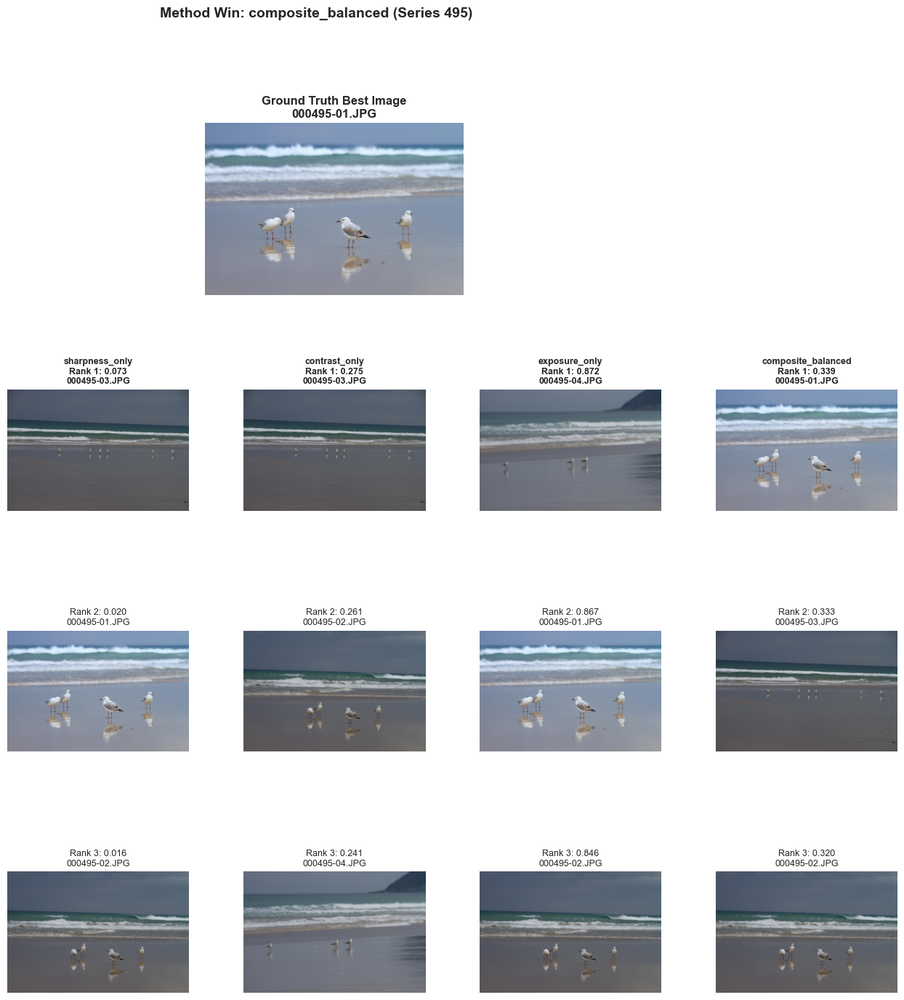


✓ Saved 12 visualization figures to D:\sim-bench\outputs\quality_benchmarks\benchmark_2025-11-14_00-06-59\analysis_reports\method_wins


In [9]:
# Visualize method wins
# Note: This will display images, so make sure image paths are accessible
output_dir = benchmark_dir / "analysis_reports" / "method_wins"
output_dir.mkdir(parents=True, exist_ok=True)

saved_figs = visualize_method_wins(
    wins_dict=wins_dict,
    series_data_dict=series_data_dict,
    top_n_methods=TOP_N_METHODS,
    top_n_images=TOP_N_IMAGES,
    output_dir=output_dir,
    show_plots=True
)

print(f"\n✓ Saved {len(saved_figs)} visualization figures to {output_dir}")



## 5. Failure Analysis

Analyze patterns in failure cases.



Failure Statistics:
  All methods fail: 431 series

  Single method success:
    sharpness_only: 358 series
    contrast_only: 340 series
    exposure_only: 140 series
    composite_balanced: 1 series
    composite_sharpness_focused: 0 series
    composite_exposure_focused: 4 series
    colorfulness_only: 204 series


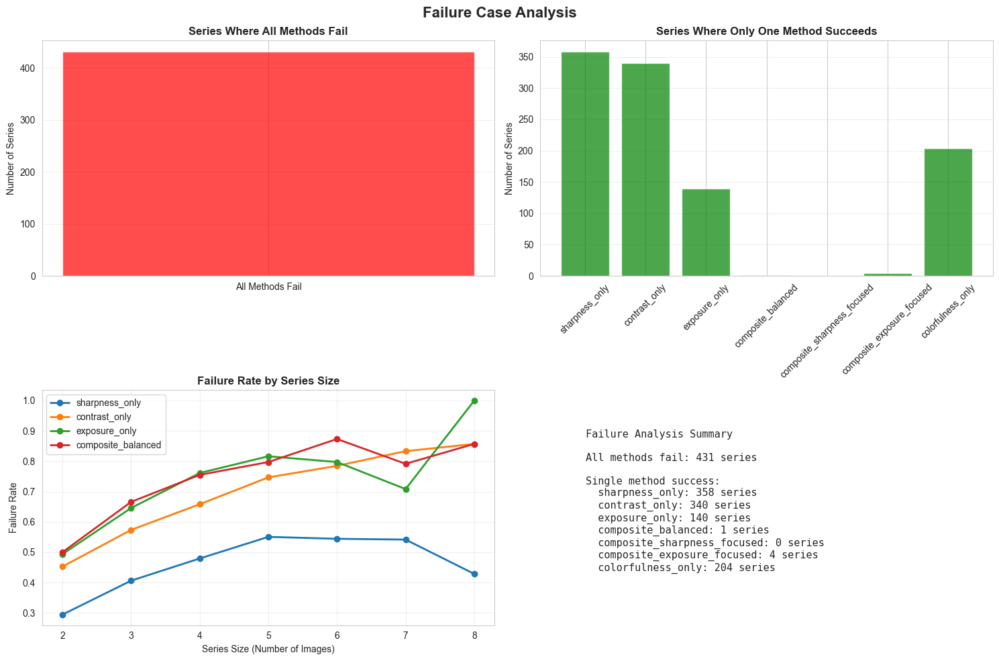

In [10]:
# Analyze failures
failure_stats = analyze_failures(merged_df, series_data_dict, methods=methods)

print("Failure Statistics:")
print(f"  All methods fail: {failure_stats.get('all_fail_count', 0)} series")
print(f"\n  Single method success:")
for method, data in failure_stats.get('single_success', {}).items():
    print(f"    {method}: {data['count']} series")

# Plot failure analysis
fig = plot_failure_analysis(failure_stats, methods=methods)
plt.show()



## 6. Export to HTML

Export this notebook to HTML for easy sharing.



In [11]:
# Export notebook to HTML
if EXPORT_HTML:
    # Get notebook path (works in Jupyter)
    try:
        import ipynbname
        notebook_path = ipynbname.path()
    except:
        # Fallback: assume we're in notebooks directory
        notebook_path = PROJECT_ROOT / "notebooks" / "quality_assessment_analysis.ipynb"
    
    output_dir = benchmark_dir / "analysis_reports"
    output_dir.mkdir(parents=True, exist_ok=True)
    
    try:
        html_path = export_notebook_to_pdf(
            str(notebook_path),
            output_dir=str(output_dir),
            timestamp=True,
            prefix="quality_assessment_analysis"
        )
        print(f"✓ Exported to HTML: {html_path.name}")
        print(f"📁 Location: {html_path}")
    except Exception as e:
        print(f"⚠ Export failed: {e}")
        print("   Make sure nbconvert is installed: pip install nbconvert")
        print("   Or manually export: File -> Download as -> HTML")
else:
    print("HTML export disabled. Set EXPORT_HTML = True to enable.")



Loading notebook: quality_assessment_analysis.ipynb
Executing notebook (this may take a few minutes)...
The message was: Cell execution timed out.
Here is a preview of the cell contents:
-------------------
['# Export notebook to HTML', 'if EXPORT_HTML:', '    # Get notebook path (works in Jupyter)', '    try:', '        import ipynbname']
...
['        print(f"⚠ Export failed: {e}")', '        print("   Make sure nbconvert is installed: pip install nbconvert")', '        print("   Or manually export: File -> Download as -> HTML")', 'else:', '    print("HTML export disabled. Set EXPORT_HTML = True to enable.")']
-------------------

Proceeding with existing outputs...
Converting to PDF...
Using WebPDFExporter (Chrome/Chromium-based)...
WebPDFExporter failed: Playwright is not installed to support Web PDF conversion. Please install `nbconvert[webpdf]` to enable.
Falling back to HTML export...
HTML saved to: D:\sim-bench\outputs\quality_benchmarks\benchmark_2025-11-14_00-06-59\analysis_r